# **Homework 6 - Generative Adversarial Network**

This is the example code of homework 6 of the machine learning course by Prof. Hung-yi Lee.


In this homework, you are required to build a generative adversarial  network for anime face generation.


## Set up the environment


In [ ]:
%reset -f

### GPU/RAM

In [ ]:
# check if using a good GPU(P100 or V100)
gpu_info = !nvidia-smi
gpu_info = "\n".join(gpu_info)
if gpu_info.find("failed") >= 0:
  print("Select the Runtime > 'Change runtime type' menu to enable a GPU accelerator, ")
  print("and then re-execute this cell.")
else:
  print(gpu_info)

# check if using high-RAM
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print("Your runtime has {:.1f} gigabytes of available RAM\n".format(ram_gb))

if ram_gb < 20:
  print("To enable a high-RAM runtime, select the Runtime > 'Change runtime type'")
  print("menu, and then select High-RAM in the Runtime shape dropdown. Then, ")
  print("re-execute this cell.")
else:
  print("You are using a high-RAM runtime!")

Tue Apr 20 04:09:15 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    36W / 300W |   1327MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Google Drive

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


### UNZIP Data and Installation

In [ ]:
!pip install -q qqdm

!unzip -q "./gdrive/MyDrive/ColabNotebooks/HW6/crypko_data.zip" -d "./"
!mv ./faces ./0
!mkdir ./faces
!mv ./0 ./faces
!ls ./faces/0 | wc -l

71314


## Random seed
Set the random seed to a certain value for reproducibility.

In [ ]:
import random

import torch
import numpy as np

def same_seeds(seed):
    # Python built-in random module
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

same_seeds(2021)

## Config

In [ ]:
import cv2
import os
import torch
from math import log2

ABS_DIR = "./gdrive/MyDrive/ColabNotebooks/HW6"
CHECKPOINT_DIR = f"{ABS_DIR}/checkpoints_512"
LOG_DIR = f"{ABS_DIR}/logs_512"
DATASET = "faces"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-3
CHANNELS_IMG = 3
Z_DIM = 512
IN_CHANNELS = 512
CRITIC_ITERATIONS = 1
LAMBDA_GP = 10
FIXED_NOISE = torch.randn(40, Z_DIM, 1, 1).to(DEVICE)
NUM_WORKERS = 4

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)

# ALPHA = 1 # should be 1e-5 in the beginning
START_TRAIN_AT_IMG_SIZE = 4 # in the beginning, it should be 4
BATCH_SIZES = [128, 128, 128, 32, 32]#, 16, 16, 8, 4]
ALPHA = 0 # should be 0 in the beginning
PROGRESSIVE_EPOCHS = [40] * len(BATCH_SIZES)



## Model

referance:

https://www.youtube.com/watch?v=nkQHASviYac&list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va&index=11&t=4156s
https://github.com/aladdinpersson/Machine-Learning-Collection/tree/master/ML/Pytorch/GANs/ProGAN

In [ ]:
"""
Implementation of ProGAN generator and discriminator with the key
attributions from the paper. We have tried to make the implementation
compact but a goal is also to keep it readable and understandable.
Specifically the key points implemented are:

1) Progressive growing (of model and layers)
2) Minibatch std on Discriminator
3) Normalization with PixelNorm
4) Equalized Learning Rate (here I cheated and only did it on Conv layers)
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
from math import log2

"""
Factors is used in Discrmininator and Generator for how much
the channels should be multiplied and expanded for each layer,
so specifically the first 5 layers the channels stay the same,
whereas when we increase the img_size (towards the later layers)
we decrease the number of chanels by 1/2, 1/4, etc.
"""
factors = [1, 1, 1, 1, 1/2, 1/4, 1/8, 1/16, 1/32]


class WSConv2d(nn.Module):
    """
    Weight scaled Conv2d (Equalized Learning Rate)
    Note that input is multiplied rather than changing weights
    this will have the same result.

    Inspired and looked at:
    https://github.com/nvnbny/progressive_growing_of_gans/blob/master/modelUtils.py
    """

    def __init__(
        self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, gain=2
    ):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain / (in_channels * (kernel_size ** 2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        # initialize conv layer
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)


class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_pixelnorm=True):
        super(ConvBlock, self).__init__()
        self.use_pn = use_pixelnorm
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.pn(x) if self.use_pn else x
        x = self.leaky(self.conv2(x))
        x = self.pn(x) if self.use_pn else x
        return x


class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()

        # initial takes 1x1 -> 4x4
        self.initial = nn.Sequential(
            PixelNorm(),
            nn.ConvTranspose2d(z_dim, in_channels, 4, 1, 0),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
        )

        self.initial_rgb = WSConv2d(
            in_channels, img_channels, kernel_size=1, stride=1, padding=0
        )
        self.prog_blocks, self.rgb_layers = (
            nn.ModuleList([]),
            nn.ModuleList([self.initial_rgb]),
        )

        for i in range(len(factors) - 1):  # -1 to prevent index error because of factors[i+1]
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(ConvBlock(conv_in_c, conv_out_c))
            self.rgb_layers.append(WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0))

    def fade_in(self, alpha, upscaled, generated):
        # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, x, alpha, steps):
        out = self.initial(x)

        if steps == 0:
            return self.initial_rgb(out)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="nearest")
            out = self.prog_blocks[step](upscaled)

        # The number of channels in upscale will stay the same, while
        # out which has moved through prog_blocks might change. To ensure
        # we can convert both to rgb we use different rgb_layers
        # (steps-1) and steps for upscaled, out respectively
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)
        return self.fade_in(alpha, final_upscaled, final_out)


class Discriminator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Discriminator, self).__init__()
        self.prog_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)

        # here we work back ways from factors because the discriminator
        # should be mirrored from the generator. So the first prog_block and
        # rgb layer we append will work for input size 1024x1024, then 512->256-> etc
        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out, use_pixelnorm=False))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )

        # perhaps confusing name "initial_rgb" this is just the RGB layer for 4x4 input size
        # did this to "mirror" the generator initial_rgb
        self.initial_rgb = WSConv2d(
            img_channels, in_channels, kernel_size=1, stride=1, padding=0
        )
        self.rgb_layers.append(self.initial_rgb)
        self.avg_pool = nn.AvgPool2d(
            kernel_size=2, stride=2
        )  # down sampling using avg pool

        # this is the block for 4x4 input size
        self.final_block = nn.Sequential(
            # +1 to in_channels because we concatenate from MiniBatch std
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, 1, kernel_size=1, padding=0, stride=1),  # we use this instead of linear layer
        )

    def fade_in(self, alpha, downscaled, out):
        """Used to fade in downscaled using avg pooling and output from CNN"""
        # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )
        # we take the std for each example (across all channels, and pixels) then we repeat it
        # for a single channel and concatenate it with the image. In this way the discriminator
        # will get information about the variation in the batch/image
        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):
        # where we should start in the list of prog_blocks, maybe a bit confusing but
        # the last is for the 4x4. So example let's say steps=1, then we should start
        # at the second to last because input_size will be 8x8. If steps==0 we just
        # use the final block
        cur_step = len(self.prog_blocks) - steps

        # convert from rgb as initial step, this will depend on
        # the image size (each will have it's on rgb layer)
        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:  # i.e, image is 4x4
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)

        # because prog_blocks might change the channels, for down scale we use rgb_layer
        # from previous/smaller size which in our case correlates to +1 in the indexing
        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))

        # the fade_in is done first between the downscaled and the input
        # this is opposite from the generator
        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)


## Utils

In [ ]:
import torch
import random
import numpy as np
import os
import torchvision
import torch.nn as nn
from torchvision.utils import save_image

def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, alpha, train_step)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

def save_checkpoint(model, optimizer, filename):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)

def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location="cuda")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr


## Training

=> Loading checkpoint
=> Loading checkpoint
Current image size: 64
Epoch [1/40]


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:00<00:00:00  1.69it/s  0.00383   -0.25741    3.22805     1    
 critic_real  critic_fake                                                       
  -1.81182     -2.11591                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

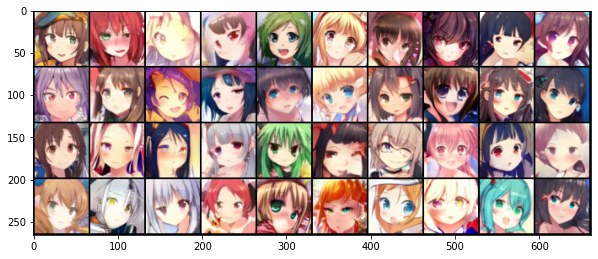

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [2/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:01<00:00:00  1.69it/s  0.00307   -0.48418    -0.00949    1    
 critic_real  critic_fake                                                       
   -0.8462     -1.36589                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

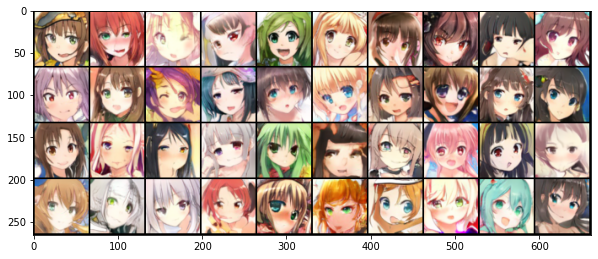

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [3/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:04<00:00:00  1.68it/s  0.00353   -1.14772    4.38709     1    
 critic_real  critic_fake                                                       
   2.23584      1.03579                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

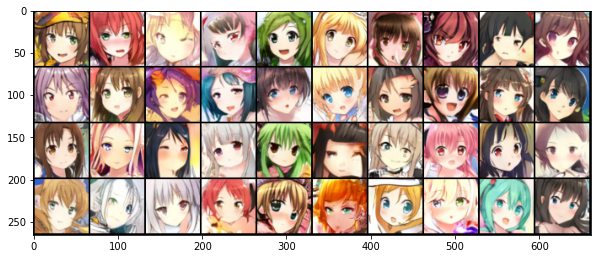

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [4/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:08<00:00:00  1.68it/s  0.00484   -0.33752    0.85772     1    
 critic_real  critic_fake                                                       
  -0.26777     -0.66434                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

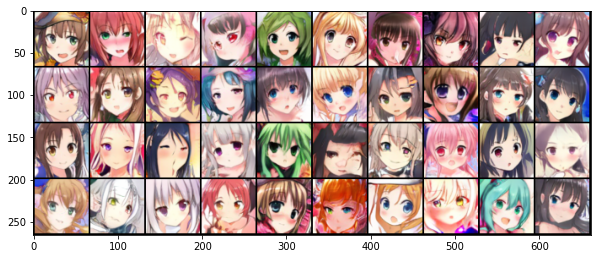

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [5/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00238   -0.24905    -2.39839    1    
 critic_real  critic_fake                                                       
  -4.38745     -4.68996                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

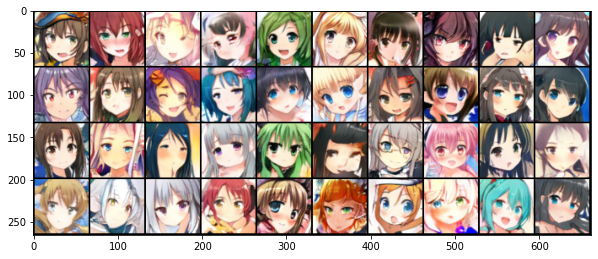

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [6/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00265   -0.45841     1.8924     1    
 critic_real  critic_fake                                                       
   3.23625      2.7301                                                          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

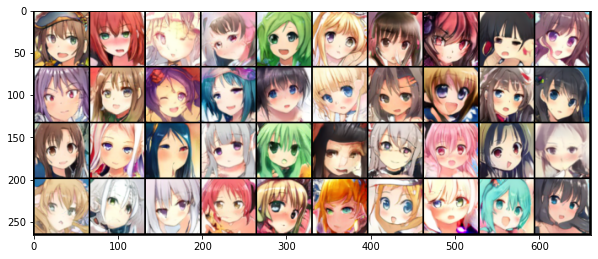

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [7/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:07<00:00:00  1.68it/s  0.01503   -0.52982    0.77234     1    
 critic_real  critic_fake                                                       
  -2.98017     -3.67396                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

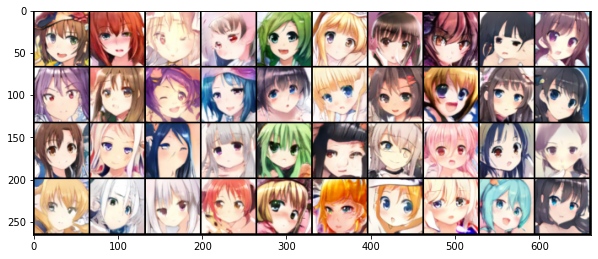

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [8/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:05<00:00:00  1.68it/s  0.00389   -0.87204    2.51828     1    
 critic_real  critic_fake                                                       
   0.98605      0.0661                                                          

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

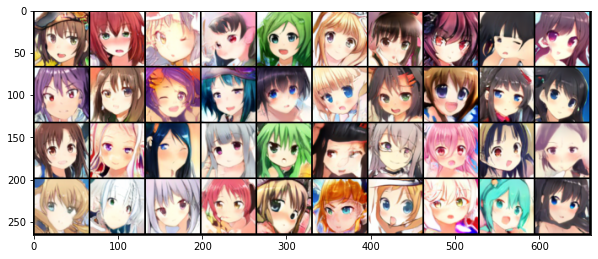

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [9/40]


   Iters      Elapsed Time      Speed      gp    loss_critic  loss_gen  alpha   
 2229/2229  00:22:06<00:00:00  1.68it/s  0.0056   -0.22385    2.57389     1     
 critic_real  critic_fake                                                       
   2.95002      2.65981                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

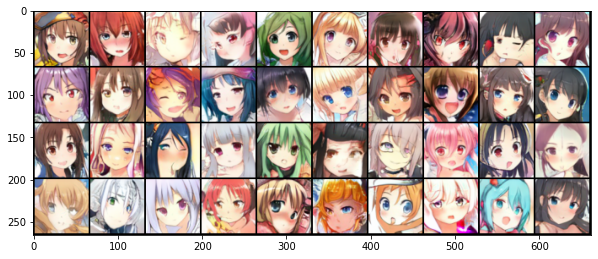

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [10/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00299   -0.70305    -2.22272    1    
 critic_real  critic_fake                                                       
  -3.86415     -4.61947                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

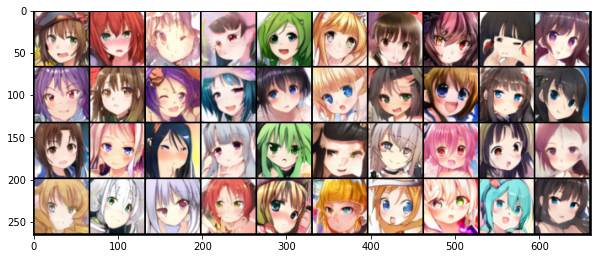

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [11/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00843   -0.83579    -2.58492    1    
 critic_real  critic_fake                                                       
  -1.57921     -2.50857                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

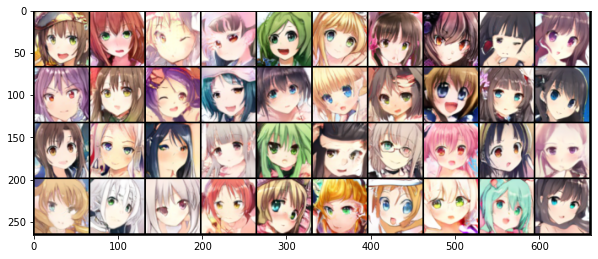

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [12/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:08<00:00:00  1.68it/s  0.00481   -1.29641    2.86211     1    
 critic_real  critic_fake                                                       
   1.32728     -0.03072                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

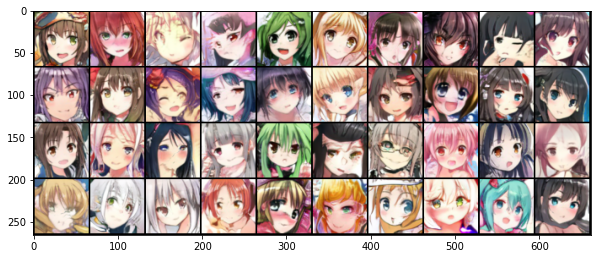

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [13/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:10<00:00:00  1.68it/s  0.00343   -0.81214    1.04309     1    
 critic_real  critic_fake                                                       
   -0.448      -1.30243                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

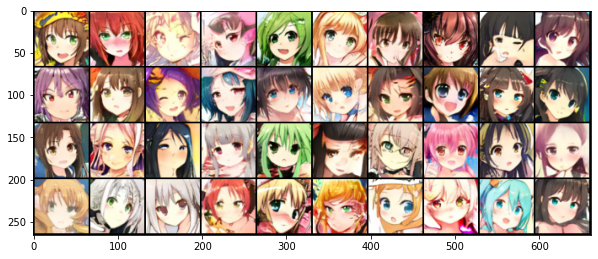

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [14/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00514    -0.7647    -2.23312    1    
 critic_real  critic_fake                                                       
  -3.42792     -4.25887                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

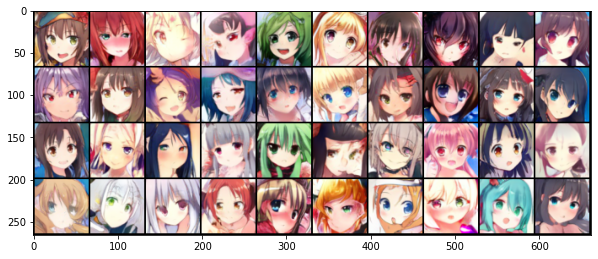

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [15/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:05<00:00:00  1.68it/s  0.01306    -0.8495    3.43951     1    
 critic_real  critic_fake                                                       
   0.52198     -0.46817                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

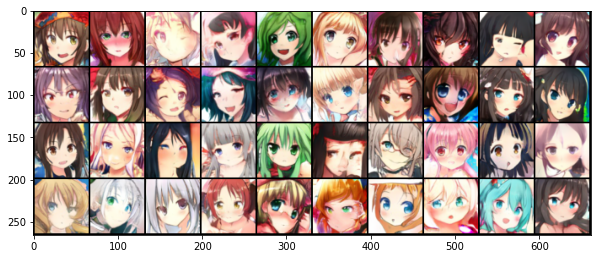

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [16/40]


   Iters      Elapsed Time      Speed      gp    loss_critic  loss_gen  alpha   
 2229/2229  00:22:04<00:00:00  1.68it/s  0.0056   -1.43565    9.11901     1     
 critic_real  critic_fake                                                       
   1.98608      0.48414                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

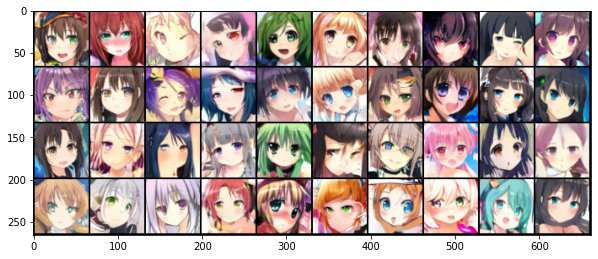

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [17/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:05<00:00:00  1.68it/s  0.00401   -0.61216    -0.84503    1    
 critic_real  critic_fake                                                       
  -5.13896     -5.82255                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

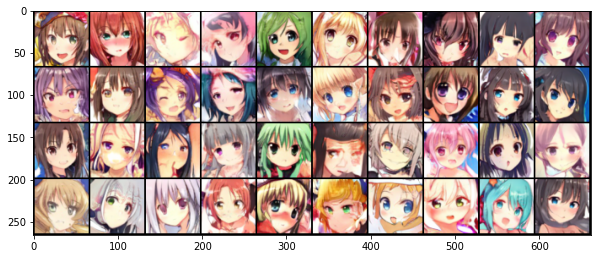

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [18/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:05<00:00:00  1.68it/s  0.00287    0.00654     1.0027     1    
 critic_real  critic_fake                                                       
  -2.32954     -2.36383                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

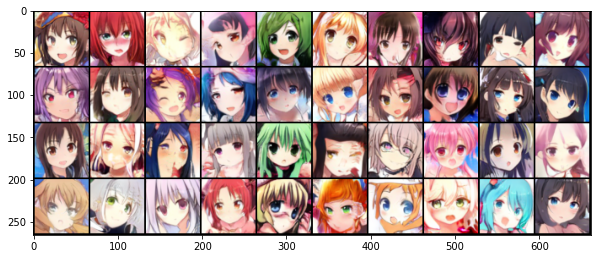

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [19/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:06<00:00:00  1.68it/s  0.00802   -0.99581    9.59965     1    
 critic_real  critic_fake                                                       
   9.30362      8.13173                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

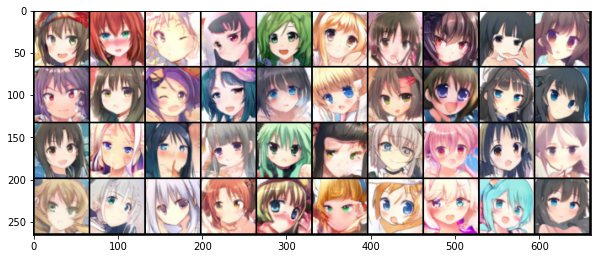

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [20/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:05<00:00:00  1.68it/s  0.00743   -0.37055    6.20228     1    
 critic_real  critic_fake                                                       
   2.8464       2.38445                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

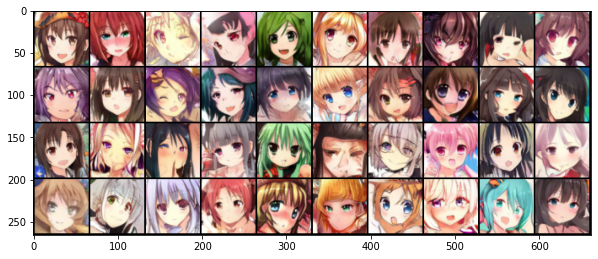

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [21/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:04<00:00:00  1.68it/s  0.00612   -0.60337    -6.76499    1    
 critic_real  critic_fake                                                       
  -8.17342     -8.91604                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

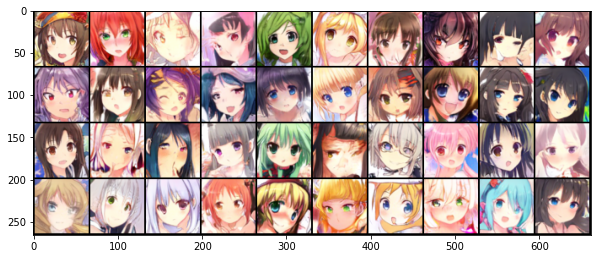

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [22/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00508   -0.53405    -3.13286    1    
 critic_real  critic_fake                                                       
  -5.42107     -6.04867                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

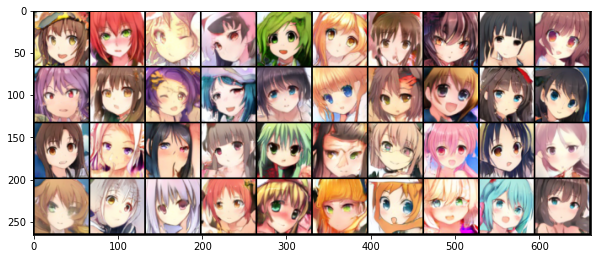

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [23/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:10<00:00:00  1.68it/s  0.00325   -1.23809    0.50961     1    
 critic_real  critic_fake                                                       
    -1.72      -2.99908                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

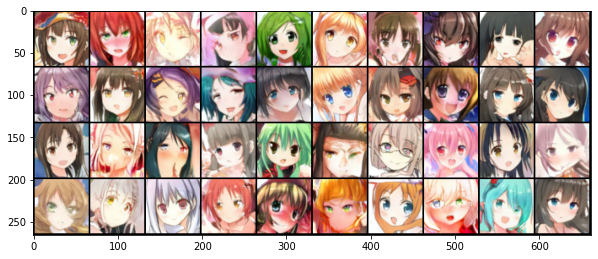

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [24/40]


   Iters      Elapsed Time      Speed      gp     loss_critic  loss_gen  alpha  
 2229/2229  00:22:09<00:00:00  1.68it/s  0.00553   -1.19352    -2.50536    1    
 critic_real  critic_fake                                                       
  -6.22993     -7.52659                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

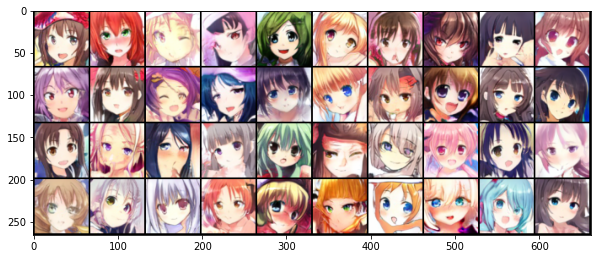

=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch [25/40]


  Iters      Elapsed Time      Speed     gp    loss_critic  loss_gen  alpha     
 468/2229  00:04:40<00:17:37  1.67it/s  0.002   -0.84225     1.597      1       
 critic_real  critic_fake                                                       
   0.60831     -0.26367                                                         

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

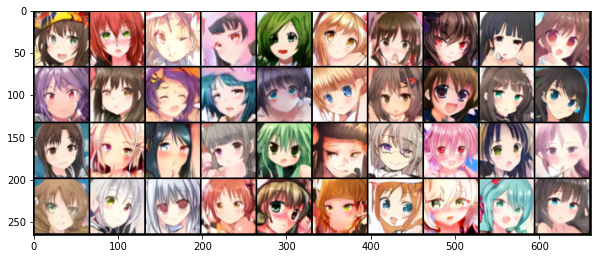

KeyboardInterrupt: ignored

In [ ]:
""" Training of ProGAN using WGAN-GP loss"""

import torch
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from math import log2
from tqdm import tqdm
from qqdm.notebook import qqdm

def get_loader(image_size):
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)],
            [0.5 for _ in range(CHANNELS_IMG)],
        ),
    ])
    batch_size = BATCH_SIZES[int(log2(image_size / 4))]
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    return loader, dataset


def train_fn(
    critic,
    gen,
    loader,
    dataset,
    step,
    alpha,
    opt_critic,
    opt_gen,
    # tensorboard_step,
    # writer,
    scaler_gen,
    scaler_critic,
    epoch,
):

    # loop = tqdm(loader, position=0, leave=True)
    loop = qqdm(loader)
    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)] <-> min -E[critic(real)] + E[critic(fake)]
        # which is equivalent to minimizing the negative of the expression
        noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(DEVICE)
        with torch.cuda.amp.autocast():
            fake = gen(noise, alpha, step)
            critic_real = critic(real, alpha, step)
            critic_fake = critic(fake.detach(), alpha, step)
            critic_real_mean = torch.mean(critic_real)
            critic_fake_mean = torch.mean(critic_fake)
            
            gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
            loss_critic = (
                -(critic_real_mean - critic_fake_mean)
                + LAMBDA_GP * gp
                + 0.001 * torch.mean(critic_real ** 2))

        opt_critic.zero_grad()
        scaler_critic.scale(loss_critic).backward()
        scaler_critic.step(opt_critic)
        scaler_critic.update()

        critic_real_mean_item = critic_real_mean.item()
        critic_fake_mean_item = critic_fake_mean.item()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        # loss_gen_item = None
        # noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(DEVICE)
        with torch.cuda.amp.autocast():
            # fake = gen(noise, alpha, step)
            gen_fake = critic(fake, alpha, step)
            loss_gen = -torch.mean(gen_fake)
            loss_gen_item = loss_gen.item()

        opt_gen.zero_grad()
        scaler_gen.scale(loss_gen).backward()
        scaler_gen.step(opt_gen)
        scaler_gen.update()

        # Update alpha and ensure less than 1
        alpha += cur_batch_size / (PROGRESSIVE_EPOCHS[step] * 0.5 * len(dataset))
        alpha = min(alpha, 1)

        if batch_idx == 0:
            with torch.no_grad():
                fixed_fakes = gen(FIXED_NOISE, alpha, step) * 0.5 + 0.5
            grid_img = torchvision.utils.make_grid(fixed_fakes.cpu(), nrow=10)
            filename = os.path.join(LOG_DIR, f'Step_{step}_Epoch_{epoch}.jpg')
            torchvision.utils.save_image(grid_img, filename, nrow=10)
            plt.figure(figsize=(10,10))
            plt.imshow(grid_img.permute(1, 2, 0))
            plt.show()

        loop.set_infos({
            'gp': round(gp.item(), 5),
            'loss_critic': round(loss_critic.item(), 5),
            'loss_gen': round(loss_gen_item, 5),
            'alpha': round(alpha, 2),
            'critic_real': round(critic_real_mean_item, 5),
            'critic_fake': round(critic_fake_mean_item, 5),
        })


    # return tensorboard_step, alpha
    return alpha


def main():
    # initialize gen and disc, note: discriminator should be called critic,
    # according to WGAN paper (since it no longer outputs between [0, 1])
    # but really who cares..
    gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
    critic = Discriminator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)

    # initialize optimizers and scalers for FP16 training
    opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
    opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
    scaler_critic = torch.cuda.amp.GradScaler()
    scaler_gen = torch.cuda.amp.GradScaler()

    # start at step that corresponds to img size that we set in config
    step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))
    alpha = ALPHA

    if os.path.isfile(f'{CHECKPOINT_DIR}/G_{step}_lastest.pth') and os.path.isfile(f'{CHECKPOINT_DIR}/C_{step}_lastest.pth'):
        load_checkpoint(f'{CHECKPOINT_DIR}/G_{step}_lastest.pth', gen, opt_gen, LEARNING_RATE)
        load_checkpoint(f'{CHECKPOINT_DIR}/C_{step}_lastest.pth', critic, opt_critic, LEARNING_RATE)

    gen.train()
    critic.train()

    for num_epochs in PROGRESSIVE_EPOCHS[step:]:
        loader, dataset = get_loader(4 * 2 ** step)  # 0->4, 1->8, 2->16, 3->32, 4->64
        print(f"Current image size: {4 * 2 ** step}")

        for epoch in range(num_epochs):
            print(f"Epoch [{epoch+1}/{num_epochs}]")
            alpha = train_fn(
                critic,
                gen,
                loader,
                dataset,
                step,
                alpha,
                opt_critic,
                opt_gen,
                scaler_gen,
                scaler_critic,
                epoch,
            )

            save_checkpoint(gen, opt_gen, filename=f'{CHECKPOINT_DIR}/G_{step}_{epoch}.pth')
            save_checkpoint(gen, opt_gen, filename=f'{CHECKPOINT_DIR}/G_{step}_lastest.pth')
            save_checkpoint(critic, opt_critic, filename=f'{CHECKPOINT_DIR}/C_{step}_{epoch}.pth')
            save_checkpoint(critic, opt_critic, filename=f'{CHECKPOINT_DIR}/C_{step}_lastest.pth')

        step += 1  # progress to the next img size
        alpha = 0

if __name__ == "__main__":
    main()


### Generating
Use the trained model to generate anime faces!

In [ ]:
from matplotlib.pyplot import imshow

def prediction(step):
    gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
    critic = Discriminator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)

    opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
    opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))

    load_checkpoint(f'{CHECKPOINT_DIR}/G_{step}_lastest.pth', gen, opt_gen, LEARNING_RATE)
    load_checkpoint(f'{CHECKPOINT_DIR}/C_{step}_lastest.pth', critic, opt_critic, LEARNING_RATE)

    gen.eval()
    critic.eval()
    alpha = 1.0
    os.makedirs('output', exist_ok=True)
    idx = 1
    for i in range(1000):
      print(i)
      with torch.cuda.amp.autocast():
        noise = torch.randn(64, Z_DIM, 1, 1).to(DEVICE)
        fake = gen(noise, alpha, step)
        critic_fake = critic(fake.detach(), alpha, step)
        critic_fake_item = critic_fake
        critic_fake_le = list(enumerate(critic_fake_item))
        critic_fake_les = sorted(critic_fake_le, key=lambda x: -x[1])
        for j in range(1):
          img = fake[critic_fake_les[j][0]] * 0.5 + 0.5
          torchvision.utils.save_image(img, f'output/{idx}.jpg')
          idx += 1
          tensor_to_PIL = transforms.ToPILImage()
          img = tensor_to_PIL(img).convert('RGB')
          print(f'critic: {critic_fake_les[j][1].item()}, noise_max: {torch.max(noise[critic_fake_les[j][0]] ** 2)}')
          imshow(np.asarray(img))
          plt.show()


In [ ]:
prediction(4)

# Compress the images.
%cd output
!tar -zcf ../images.tgz *.jpg
%cd ..